In [5]:
import torch
import numpy as np
import torchvision.models as models
import matplotlib.pyplot as plt
import pickle

In [8]:
tokenizer = torch.hub.load('huggingface/pytorch-transformers', 'tokenizer', 'bert-base-uncased')    # Download vocabulary from S3 and cache.
# tokenizer = torch.hub.load('huggingface/pytorch-transformers', 'tokenizer', './test/bert_saved_model/')  # E.g. tokenizer was saved using `save_pretrained('./test/saved_model/')`

model = torch.hub.load('huggingface/pytorch-transformers', 'model', 'bert-base-uncased', output_attentions=True)  # Update configuration during loading

assert model.config.output_attentions == True
# Loading from a TF checkpoint file instead of a PyTorch model (slower)


Using cache found in /home/zhizhenz/.cache/torch/hub/huggingface_pytorch-transformers_master
Using cache found in /home/zhizhenz/.cache/torch/hub/huggingface_pytorch-transformers_master
Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertFor

Let us look at Bert Transformer model.

In [9]:
model

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0): BertLayer(
        (attention): BertAttention(
          (self): BertSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False)
          

In [11]:
for i in range(12):
    locals()["bert_lin_"+str(i)+"_0"] = model.encoder.layer[i].attention.self.query.weight[:].detach().numpy()
    locals()["bert_lin_"+str(i)+"_1"] = model.encoder.layer[i].attention.self.key.weight[:].detach().numpy()
    locals()["bert_lin_"+str(i)+"_2"] = model.encoder.layer[i].attention.self.value.weight[:].detach().numpy()
    locals()["bert_lin_"+str(i)+"_3"] = model.encoder.layer[i].attention.output.dense.weight[:].detach().numpy()
    locals()["bert_lin_"+str(i)+"_4"] = model.encoder.layer[i].intermediate.dense.weight[:].detach().numpy()
    locals()["bert_lin_"+str(i)+"_5"] = model.encoder.layer[i].output.dense.weight[:].detach().numpy()

    print("bert_lin_"+str(i)+"_0", locals()["bert_lin_"+str(i)+"_1"].shape)
    print("bert_lin_"+str(i)+"_1", locals()["bert_lin_"+str(i)+"_2"].shape)
    print("bert_lin_"+str(i)+"_2", locals()["bert_lin_"+str(i)+"_3"].shape)
    print("bert_lin_"+str(i)+"_3", locals()["bert_lin_"+str(i)+"_1"].shape)
    print("bert_lin_"+str(i)+"_4", locals()["bert_lin_"+str(i)+"_2"].shape)
    print("bert_lin_"+str(i)+"_2", locals()["bert_lin_"+str(i)+"_3"].shape)

final_lin = model.pooler.dense.weight[:].detach().numpy()
print("final_lin", final_lin.shape)


bert_lin_0_0 (768, 768)
bert_lin_0_1 (768, 768)
bert_lin_0_2 (768, 768)
bert_lin_0_3 (768, 768)
bert_lin_0_4 (768, 768)
bert_lin_0_2 (768, 768)
bert_lin_1_0 (768, 768)
bert_lin_1_1 (768, 768)
bert_lin_1_2 (768, 768)
bert_lin_1_3 (768, 768)
bert_lin_1_4 (768, 768)
bert_lin_1_2 (768, 768)
bert_lin_2_0 (768, 768)
bert_lin_2_1 (768, 768)
bert_lin_2_2 (768, 768)
bert_lin_2_3 (768, 768)
bert_lin_2_4 (768, 768)
bert_lin_2_2 (768, 768)
bert_lin_3_0 (768, 768)
bert_lin_3_1 (768, 768)
bert_lin_3_2 (768, 768)
bert_lin_3_3 (768, 768)
bert_lin_3_4 (768, 768)
bert_lin_3_2 (768, 768)
bert_lin_4_0 (768, 768)
bert_lin_4_1 (768, 768)
bert_lin_4_2 (768, 768)
bert_lin_4_3 (768, 768)
bert_lin_4_4 (768, 768)
bert_lin_4_2 (768, 768)
bert_lin_5_0 (768, 768)
bert_lin_5_1 (768, 768)
bert_lin_5_2 (768, 768)
bert_lin_5_3 (768, 768)
bert_lin_5_4 (768, 768)
bert_lin_5_2 (768, 768)
bert_lin_6_0 (768, 768)
bert_lin_6_1 (768, 768)
bert_lin_6_2 (768, 768)
bert_lin_6_3 (768, 768)
bert_lin_6_4 (768, 768)
bert_lin_6_2 (76

In [12]:
from analyze_model import Plot2DMatrix, PlotVectorSizes

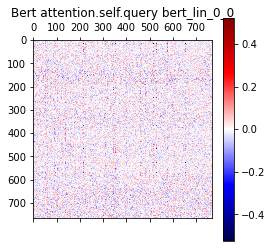

100%|██████████| 768/768 [00:01<00:00, 611.12it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


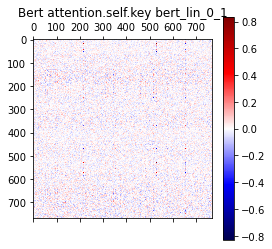

100%|██████████| 768/768 [00:01<00:00, 613.61it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


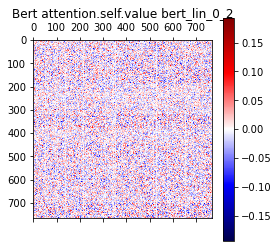

100%|██████████| 768/768 [00:01<00:00, 625.69it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


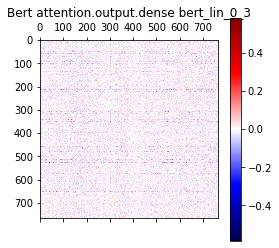

100%|██████████| 768/768 [00:01<00:00, 611.14it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


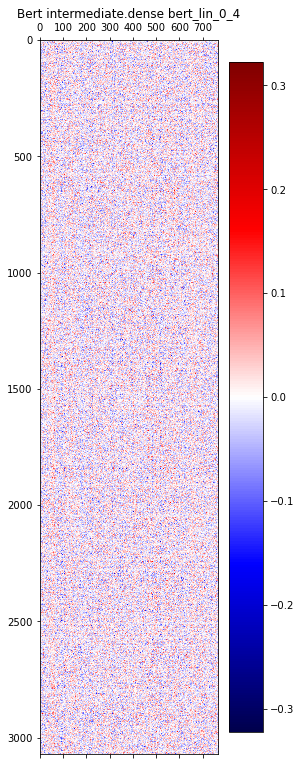

100%|██████████| 3072/3072 [00:04<00:00, 622.96it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


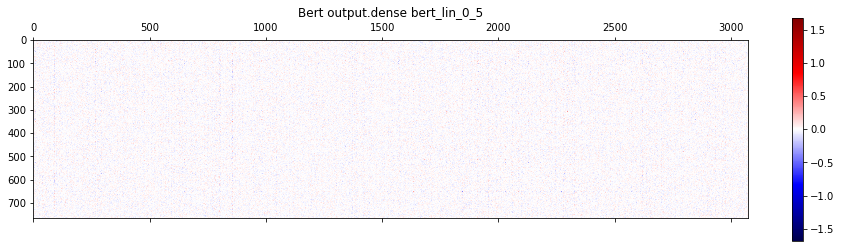

100%|██████████| 768/768 [00:04<00:00, 155.50it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


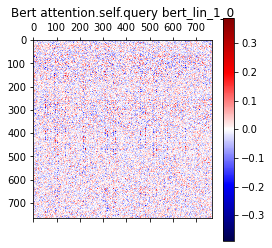

100%|██████████| 768/768 [00:01<00:00, 610.35it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


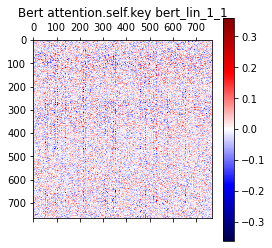

100%|██████████| 768/768 [00:01<00:00, 608.99it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


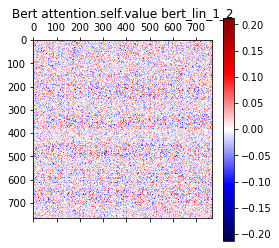

100%|██████████| 768/768 [00:01<00:00, 613.37it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


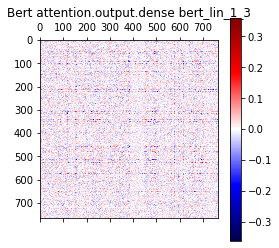

100%|██████████| 768/768 [00:01<00:00, 611.27it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


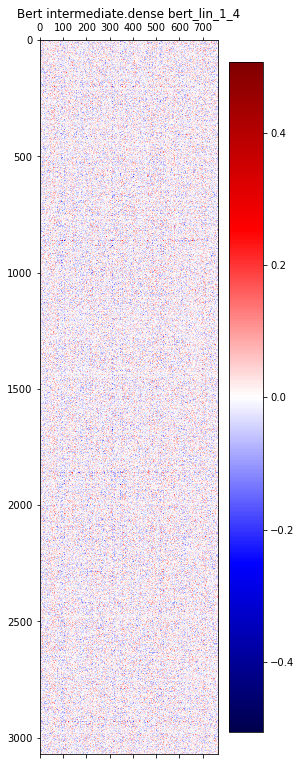

100%|██████████| 3072/3072 [00:04<00:00, 618.20it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


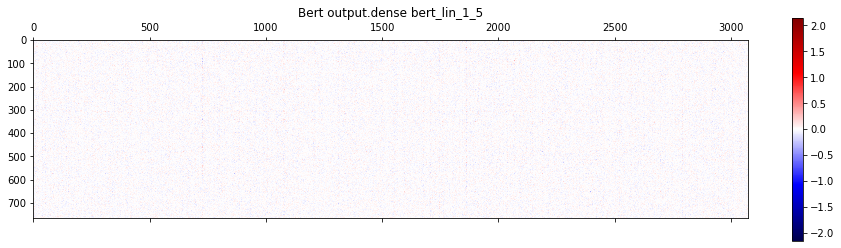

100%|██████████| 768/768 [00:04<00:00, 155.35it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


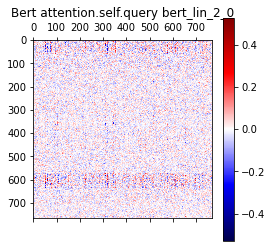

100%|██████████| 768/768 [00:01<00:00, 615.32it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


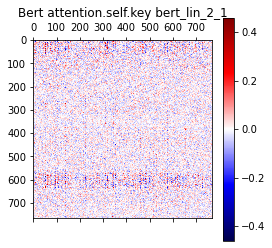

100%|██████████| 768/768 [00:01<00:00, 607.41it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


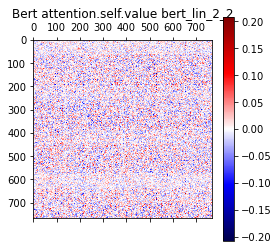

100%|██████████| 768/768 [00:01<00:00, 608.54it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


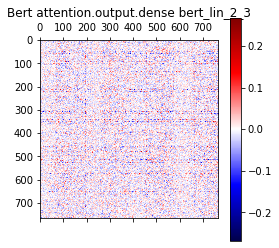

100%|██████████| 768/768 [00:01<00:00, 611.85it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


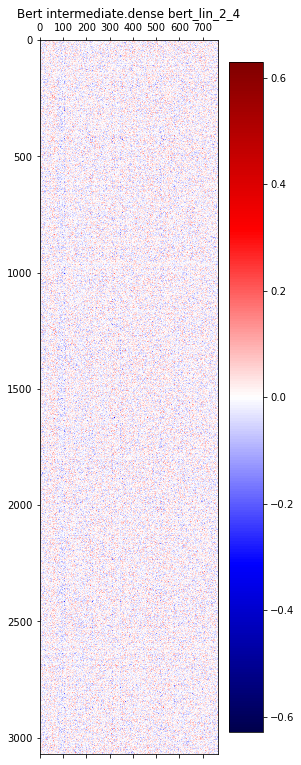

100%|██████████| 3072/3072 [00:05<00:00, 611.99it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


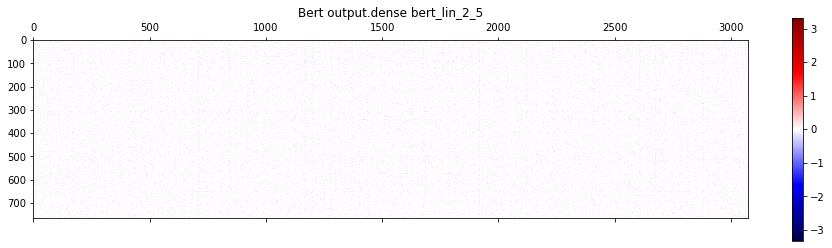

100%|██████████| 768/768 [00:04<00:00, 154.38it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


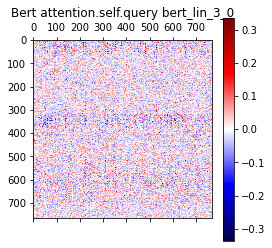

100%|██████████| 768/768 [00:01<00:00, 605.05it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


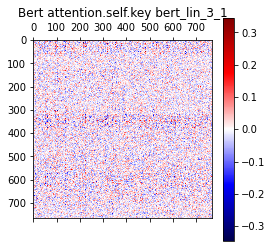

100%|██████████| 768/768 [00:01<00:00, 608.82it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


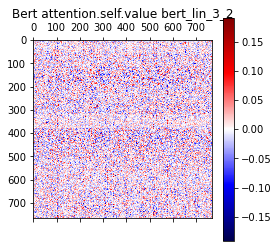

100%|██████████| 768/768 [00:01<00:00, 608.23it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


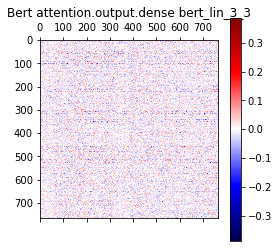

100%|██████████| 768/768 [00:01<00:00, 611.05it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


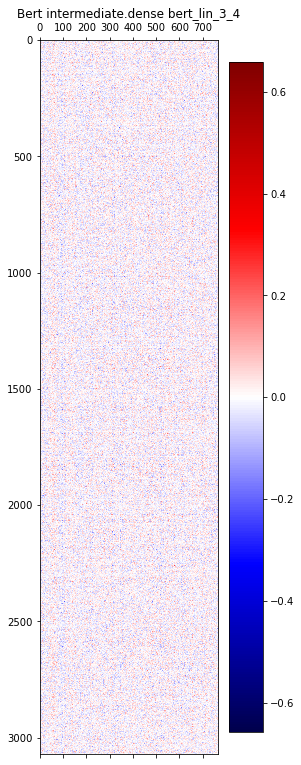

100%|██████████| 3072/3072 [00:04<00:00, 622.09it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


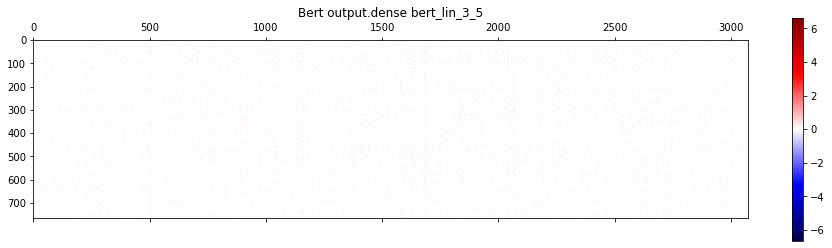

100%|██████████| 768/768 [00:04<00:00, 155.13it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


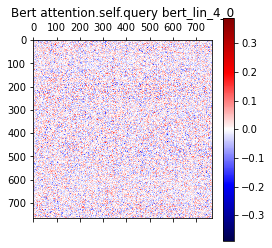

100%|██████████| 768/768 [00:01<00:00, 623.48it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


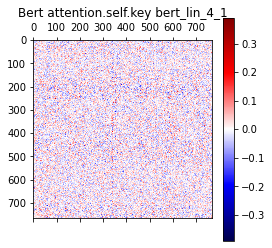

100%|██████████| 768/768 [00:01<00:00, 621.37it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


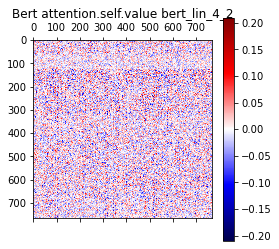

100%|██████████| 768/768 [00:01<00:00, 611.94it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


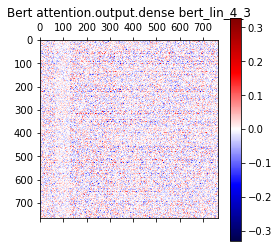

100%|██████████| 768/768 [00:01<00:00, 620.83it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


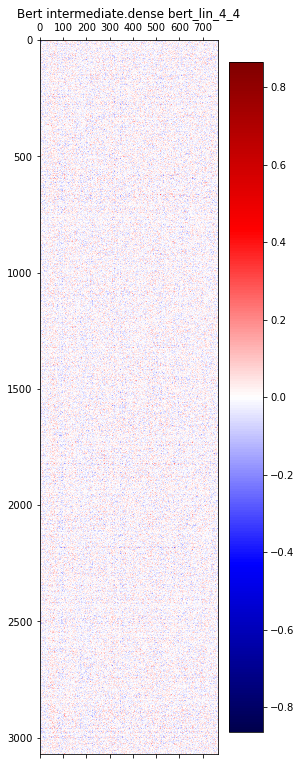

100%|██████████| 3072/3072 [00:04<00:00, 623.48it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


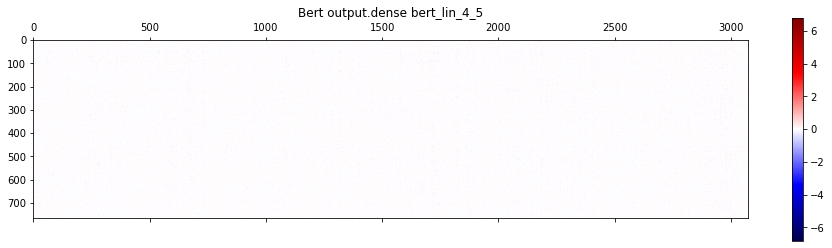

100%|██████████| 768/768 [00:04<00:00, 154.91it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


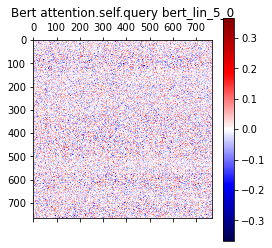

100%|██████████| 768/768 [00:01<00:00, 611.09it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


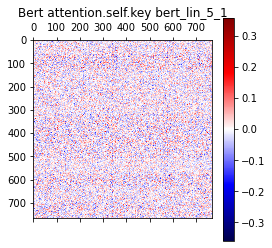

100%|██████████| 768/768 [00:01<00:00, 608.59it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


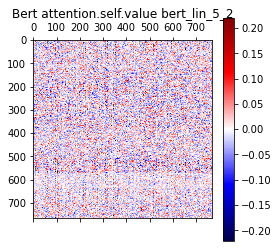

100%|██████████| 768/768 [00:01<00:00, 619.53it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


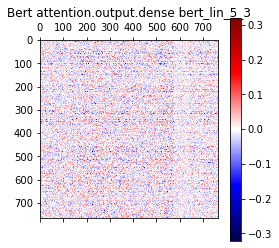

100%|██████████| 768/768 [00:01<00:00, 614.54it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


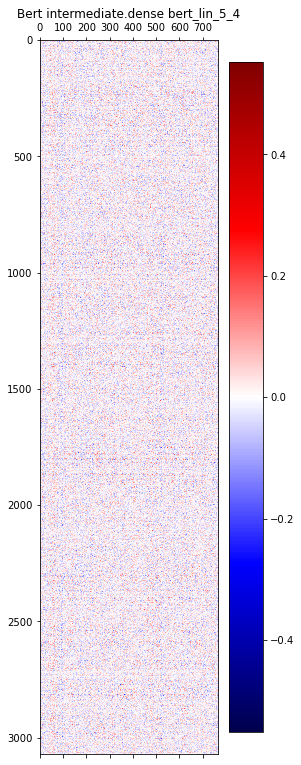

100%|██████████| 3072/3072 [00:04<00:00, 620.31it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


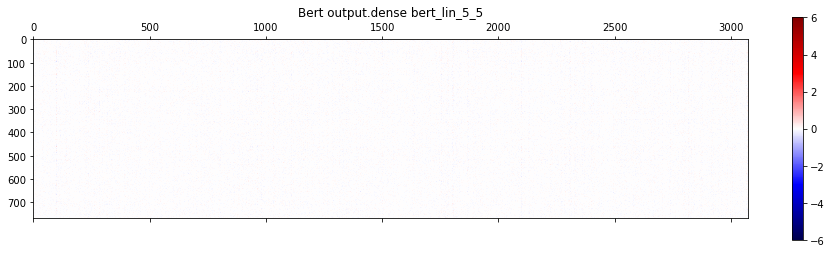

100%|██████████| 768/768 [00:04<00:00, 154.28it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


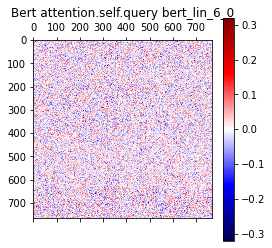

100%|██████████| 768/768 [00:01<00:00, 614.78it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


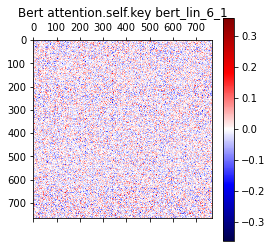

100%|██████████| 768/768 [00:01<00:00, 612.55it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


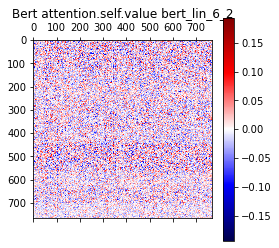

100%|██████████| 768/768 [00:01<00:00, 610.16it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


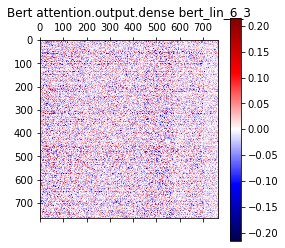

100%|██████████| 768/768 [00:01<00:00, 618.43it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


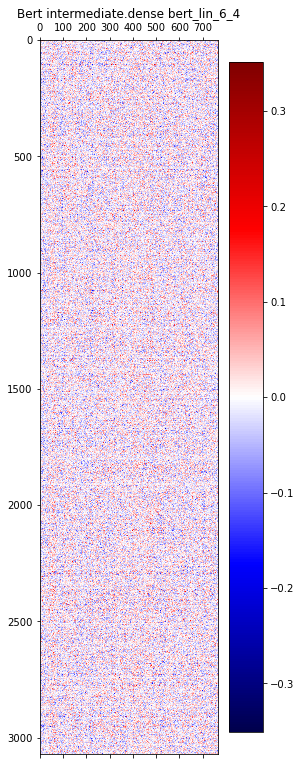

100%|██████████| 3072/3072 [00:04<00:00, 621.71it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


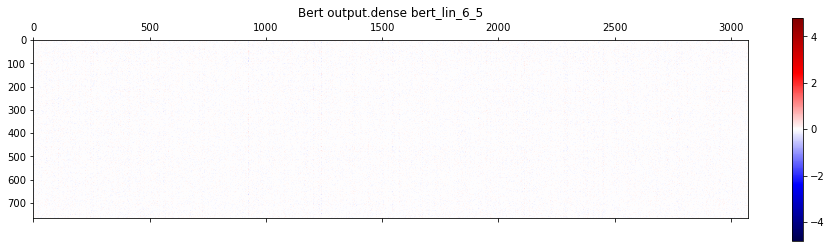

100%|██████████| 768/768 [00:04<00:00, 153.94it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


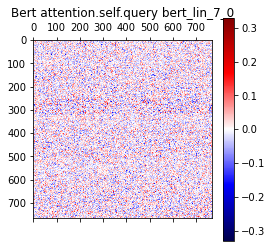

100%|██████████| 768/768 [00:01<00:00, 613.39it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


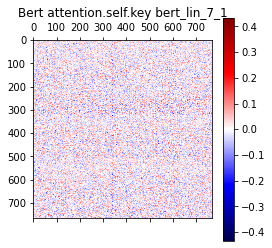

100%|██████████| 768/768 [00:01<00:00, 607.21it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


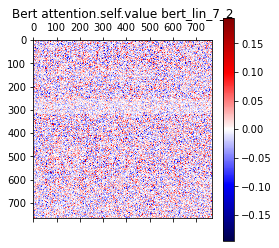

100%|██████████| 768/768 [00:01<00:00, 619.29it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


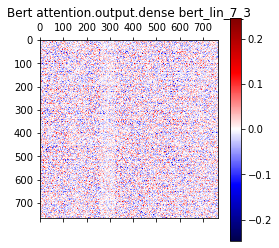

100%|██████████| 768/768 [00:01<00:00, 618.19it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


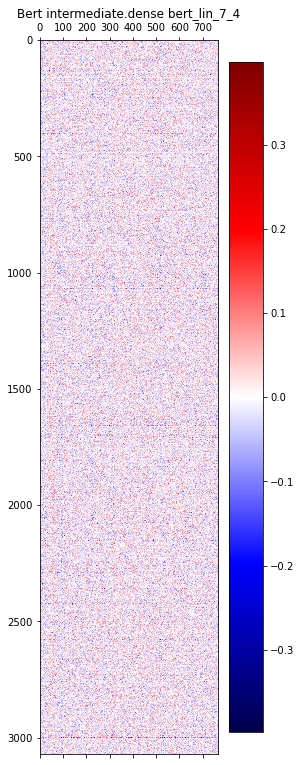

100%|██████████| 3072/3072 [00:04<00:00, 620.74it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


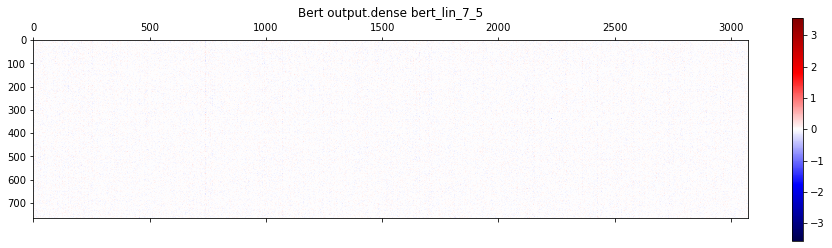

100%|██████████| 768/768 [00:04<00:00, 153.95it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


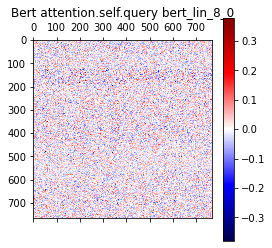

100%|██████████| 768/768 [00:01<00:00, 619.17it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


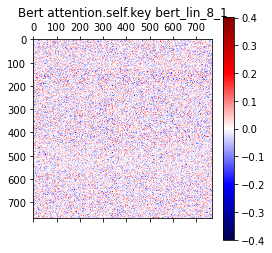

100%|██████████| 768/768 [00:01<00:00, 611.52it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


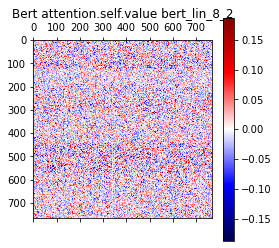

100%|██████████| 768/768 [00:01<00:00, 613.39it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


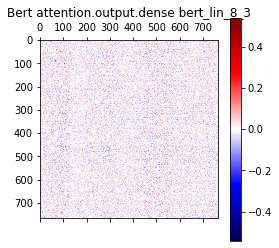

100%|██████████| 768/768 [00:01<00:00, 614.07it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


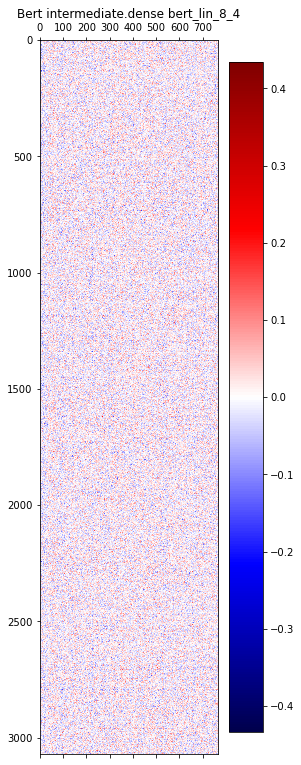

100%|██████████| 3072/3072 [00:04<00:00, 617.54it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


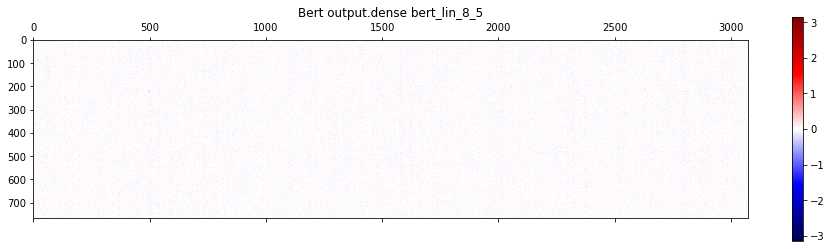

100%|██████████| 768/768 [00:04<00:00, 155.55it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


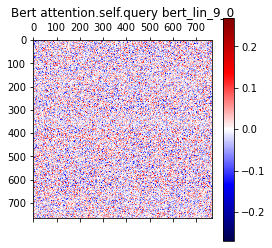

100%|██████████| 768/768 [00:01<00:00, 614.05it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


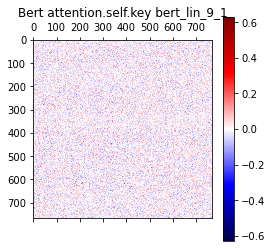

100%|██████████| 768/768 [00:01<00:00, 616.31it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


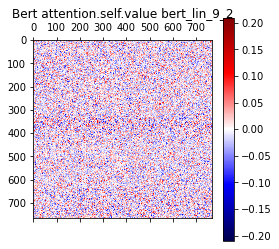

100%|██████████| 768/768 [00:01<00:00, 613.41it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


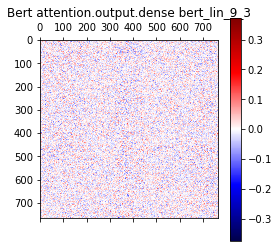

100%|██████████| 768/768 [00:01<00:00, 618.31it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


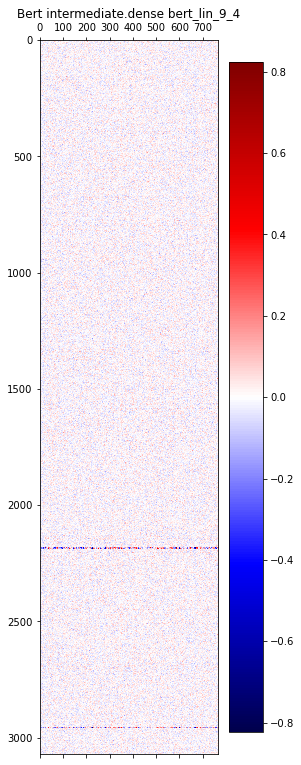

100%|██████████| 3072/3072 [00:04<00:00, 616.41it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


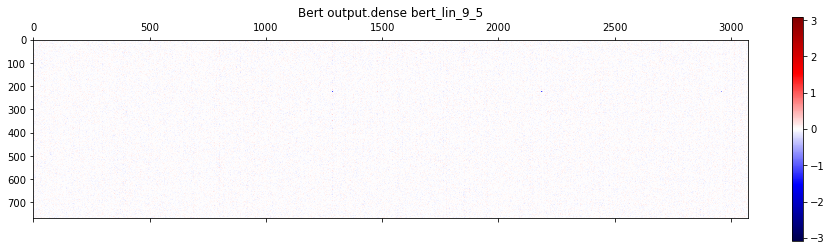

100%|██████████| 768/768 [00:04<00:00, 154.10it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


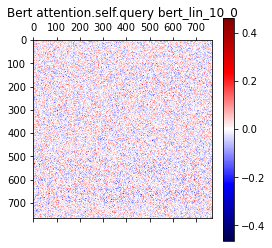

100%|██████████| 768/768 [00:01<00:00, 616.04it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


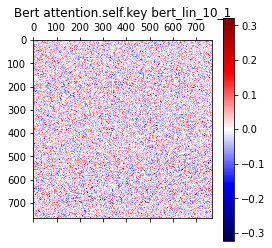

100%|██████████| 768/768 [00:01<00:00, 605.53it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


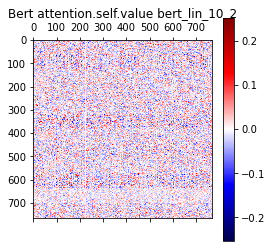

100%|██████████| 768/768 [00:01<00:00, 621.67it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


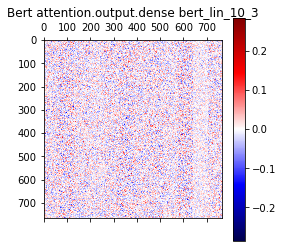

100%|██████████| 768/768 [00:01<00:00, 604.79it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


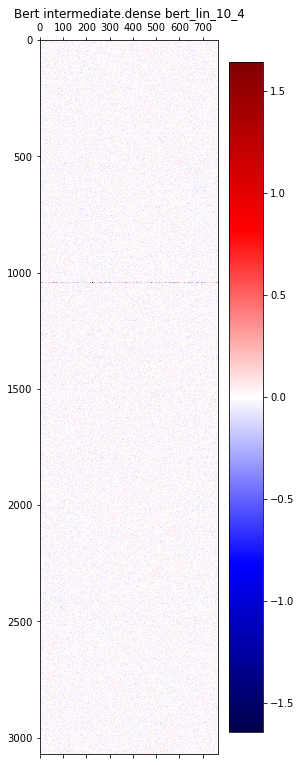

100%|██████████| 3072/3072 [00:04<00:00, 621.37it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


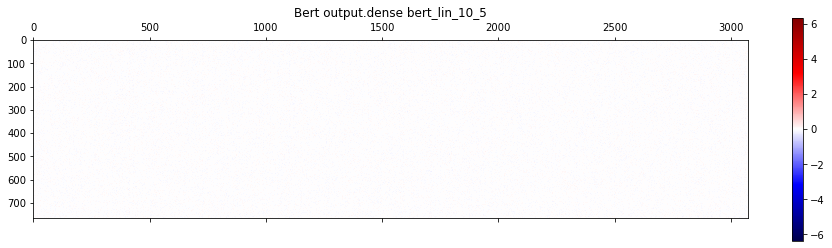

100%|██████████| 768/768 [00:04<00:00, 154.85it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


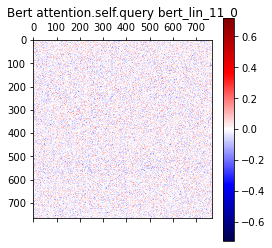

100%|██████████| 768/768 [00:01<00:00, 610.58it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


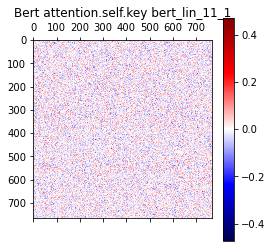

100%|██████████| 768/768 [00:01<00:00, 616.15it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


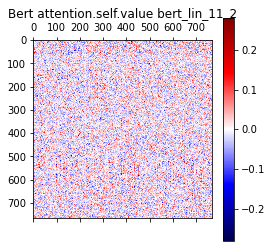

100%|██████████| 768/768 [00:01<00:00, 610.14it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


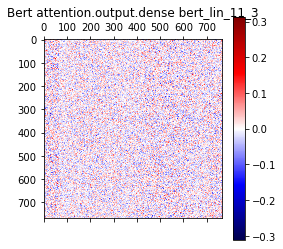

100%|██████████| 768/768 [00:01<00:00, 614.06it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


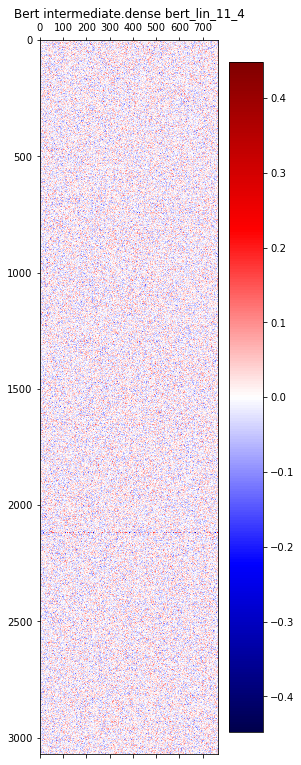

100%|██████████| 3072/3072 [00:04<00:00, 621.38it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


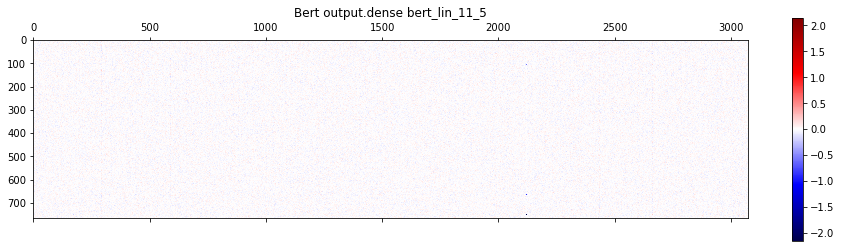

100%|██████████| 768/768 [00:04<00:00, 154.79it/s]


There are totally 0 zero elements in this matrix, percentage is 0.0


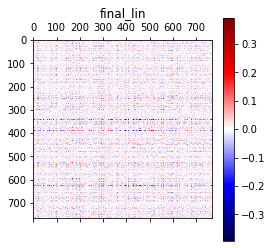

100%|██████████| 768/768 [00:01<00:00, 618.85it/s]

There are totally 0 zero elements in this matrix, percentage is 0.0


In [15]:
for i in range(12):
    Plot2DMatrix(locals()["bert_lin_"+str(i)+"_0"], "Bert attention.self.query bert_lin_"+str(i)+"_0", color_map="seismic")
    Plot2DMatrix(locals()["bert_lin_"+str(i)+"_1"], "Bert attention.self.key bert_lin_"+str(i)+"_1", color_map="seismic")
    Plot2DMatrix(locals()["bert_lin_"+str(i)+"_2"], "Bert attention.self.value bert_lin_"+str(i)+"_2", color_map="seismic")
    Plot2DMatrix(locals()["bert_lin_"+str(i)+"_3"], "Bert attention.output.dense bert_lin_"+str(i)+"_3", color_map="seismic")
    Plot2DMatrix(locals()["bert_lin_"+str(i)+"_4"], "Bert intermediate.dense bert_lin_"+str(i)+"_4", color_map="seismic")
    Plot2DMatrix(locals()["bert_lin_"+str(i)+"_5"], "Bert output.dense bert_lin_"+str(i)+"_5", color_map="seismic")

Plot2DMatrix(final_lin, "final_lin", color_map="seismic")

Now, let us do some pruning on the fully connected layer.

In [16]:
import torch.nn.utils.prune as prune

## global pruning
parameters_to_prune = (
    (model.encoder.layer[0].attention.self.query, 'weight'),
    (model.encoder.layer[0].attention.self.key, 'weight'),
    (model.encoder.layer[0].attention.self.value, 'weight'),
    (model.encoder.layer[0].attention.output.dense, 'weight'),
    (model.encoder.layer[0].intermediate.dense, 'weight'),
    (model.encoder.layer[0].output.dense, 'weight'),
    (model.encoder.layer[1].attention.self.query, 'weight'),
    (model.encoder.layer[1].attention.self.key, 'weight'),
    (model.encoder.layer[1].attention.self.value, 'weight'),
    (model.encoder.layer[1].attention.output.dense, 'weight'),
    (model.encoder.layer[1].intermediate.dense, 'weight'),
    (model.encoder.layer[1].output.dense, 'weight'),
    (model.encoder.layer[2].attention.self.query, 'weight'),
    (model.encoder.layer[2].attention.self.key, 'weight'),
    (model.encoder.layer[2].attention.self.value, 'weight'),
    (model.encoder.layer[2].attention.output.dense, 'weight'),
    (model.encoder.layer[2].intermediate.dense, 'weight'),
    (model.encoder.layer[2].output.dense, 'weight'),
    (model.encoder.layer[3].attention.self.query, 'weight'),
    (model.encoder.layer[3].attention.self.key, 'weight'),
    (model.encoder.layer[3].attention.self.value, 'weight'),
    (model.encoder.layer[3].attention.output.dense, 'weight'),
    (model.encoder.layer[3].intermediate.dense, 'weight'),
    (model.encoder.layer[3].output.dense, 'weight'),
    (model.encoder.layer[4].attention.self.query, 'weight'),
    (model.encoder.layer[4].attention.self.key, 'weight'),
    (model.encoder.layer[4].attention.self.value, 'weight'),
    (model.encoder.layer[4].attention.output.dense, 'weight'),
    (model.encoder.layer[4].intermediate.dense, 'weight'),
    (model.encoder.layer[4].output.dense, 'weight'),
    (model.encoder.layer[5].attention.self.query, 'weight'),
    (model.encoder.layer[5].attention.self.key, 'weight'),
    (model.encoder.layer[5].attention.self.value, 'weight'),
    (model.encoder.layer[5].attention.output.dense, 'weight'),
    (model.encoder.layer[5].intermediate.dense, 'weight'),
    (model.encoder.layer[5].output.dense, 'weight'),
    (model.encoder.layer[6].attention.self.query, 'weight'),
    (model.encoder.layer[6].attention.self.key, 'weight'),
    (model.encoder.layer[6].attention.self.value, 'weight'),
    (model.encoder.layer[6].attention.output.dense, 'weight'),
    (model.encoder.layer[6].intermediate.dense, 'weight'),
    (model.encoder.layer[6].output.dense, 'weight'),
    (model.encoder.layer[7].attention.self.query, 'weight'),
    (model.encoder.layer[7].attention.self.key, 'weight'),
    (model.encoder.layer[7].attention.self.value, 'weight'),
    (model.encoder.layer[7].attention.output.dense, 'weight'),
    (model.encoder.layer[7].intermediate.dense, 'weight'),
    (model.encoder.layer[7].output.dense, 'weight'),
    (model.encoder.layer[8].attention.self.query, 'weight'),
    (model.encoder.layer[8].attention.self.key, 'weight'),
    (model.encoder.layer[8].attention.self.value, 'weight'),
    (model.encoder.layer[8].attention.output.dense, 'weight'),
    (model.encoder.layer[8].intermediate.dense, 'weight'),
    (model.encoder.layer[8].output.dense, 'weight'),
    (model.encoder.layer[9].attention.self.query, 'weight'),
    (model.encoder.layer[9].attention.self.key, 'weight'),
    (model.encoder.layer[9].attention.self.value, 'weight'),
    (model.encoder.layer[9].attention.output.dense, 'weight'),
    (model.encoder.layer[9].intermediate.dense, 'weight'),
    (model.encoder.layer[9].output.dense, 'weight'),
    (model.encoder.layer[10].attention.self.query, 'weight'),
    (model.encoder.layer[10].attention.self.key, 'weight'),
    (model.encoder.layer[10].attention.self.value, 'weight'),
    (model.encoder.layer[10].attention.output.dense, 'weight'),
    (model.encoder.layer[10].intermediate.dense, 'weight'),
    (model.encoder.layer[10].output.dense, 'weight'),
    (model.encoder.layer[11].attention.self.query, 'weight'),
    (model.encoder.layer[11].attention.self.key, 'weight'),
    (model.encoder.layer[11].attention.self.value, 'weight'),
    (model.encoder.layer[11].attention.output.dense, 'weight'),
    (model.encoder.layer[11].intermediate.dense, 'weight'),
    (model.encoder.layer[11].output.dense, 'weight'),
    (model.pooler.dense, 'weight'),
)

prune.global_unstructured(
    parameters_to_prune,
    pruning_method=prune.L1Unstructured,
    amount=0.8,
)

In [17]:
for i in range(12):
    locals()["compressed_bert_lin_"+str(i)+"_0"] = model.encoder.layer[i].attention.self.query.weight[:].detach().numpy()
    locals()["compressed_bert_lin_"+str(i)+"_1"] = model.encoder.layer[i].attention.self.key.weight[:].detach().numpy()
    locals()["compressed_bert_lin_"+str(i)+"_2"] = model.encoder.layer[i].attention.self.value.weight[:].detach().numpy()
    locals()["compressed_bert_lin_"+str(i)+"_3"] = model.encoder.layer[i].attention.output.dense.weight[:].detach().numpy()
    locals()["compressed_bert_lin_"+str(i)+"_4"] = model.encoder.layer[i].intermediate.dense.weight[:].detach().numpy()
    locals()["compressed_bert_lin_"+str(i)+"_5"] = model.encoder.layer[i].output.dense.weight[:].detach().numpy()
    
    print("compressed_bert_lin_"+str(i)+"_0", locals()["compressed_bert_lin_"+str(i)+"_1"].shape)
    print("compressed_bert_lin_"+str(i)+"_1", locals()["compressed_bert_lin_"+str(i)+"_2"].shape)
    print("compressed_bert_lin_"+str(i)+"_2", locals()["compressed_bert_lin_"+str(i)+"_3"].shape)
    print("compressed_bert_lin_"+str(i)+"_3", locals()["compressed_bert_lin_"+str(i)+"_1"].shape)
    print("compressed_bert_lin_"+str(i)+"_4", locals()["compressed_bert_lin_"+str(i)+"_2"].shape)
    print("compressed_bert_lin_"+str(i)+"_5", locals()["compressed_bert_lin_"+str(i)+"_3"].shape)
    
compressed_final_lin = model.pooler.dense.weight[:].detach().numpy()
print("compressed_final_lin", compressed_final_lin.shape)

compressed_bert_lin_0_0 (768, 768)
compressed_bert_lin_0_1 (768, 768)
compressed_bert_lin_0_2 (768, 768)
compressed_bert_lin_0_3 (768, 768)
compressed_bert_lin_0_4 (768, 768)
compressed_bert_lin_0_5 (768, 768)
compressed_bert_lin_1_0 (768, 768)
compressed_bert_lin_1_1 (768, 768)
compressed_bert_lin_1_2 (768, 768)
compressed_bert_lin_1_3 (768, 768)
compressed_bert_lin_1_4 (768, 768)
compressed_bert_lin_1_5 (768, 768)
compressed_bert_lin_2_0 (768, 768)
compressed_bert_lin_2_1 (768, 768)
compressed_bert_lin_2_2 (768, 768)
compressed_bert_lin_2_3 (768, 768)
compressed_bert_lin_2_4 (768, 768)
compressed_bert_lin_2_5 (768, 768)
compressed_bert_lin_3_0 (768, 768)
compressed_bert_lin_3_1 (768, 768)
compressed_bert_lin_3_2 (768, 768)
compressed_bert_lin_3_3 (768, 768)
compressed_bert_lin_3_4 (768, 768)
compressed_bert_lin_3_5 (768, 768)
compressed_bert_lin_4_0 (768, 768)
compressed_bert_lin_4_1 (768, 768)
compressed_bert_lin_4_2 (768, 768)
compressed_bert_lin_4_3 (768, 768)
compressed_bert_lin_

100%|██████████| 768/768 [00:01<00:00, 618.11it/s]
/home/zhizhenz/lightning-master/simulation/models/analyze_model.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 3, figsize=(18,3), sharey=False, tight_layout=True)
100%|██████████| 768/768 [00:01<00:00, 618.76it/s]


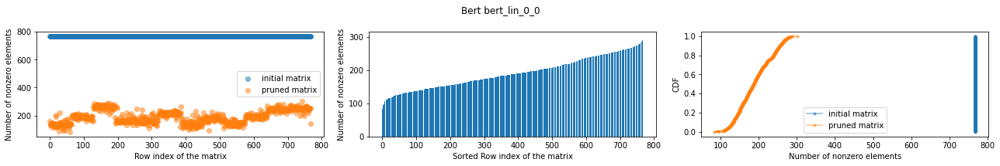

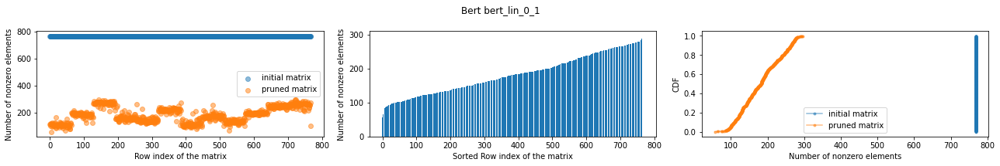

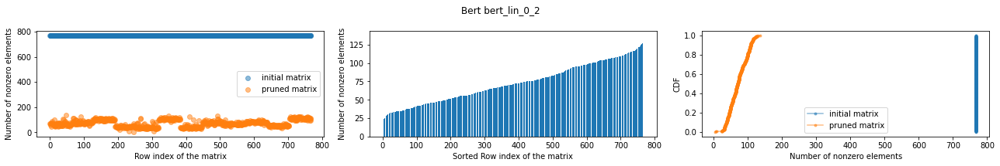

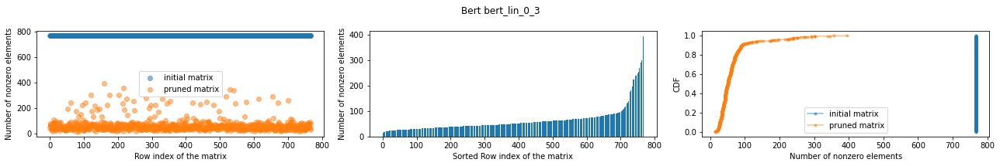

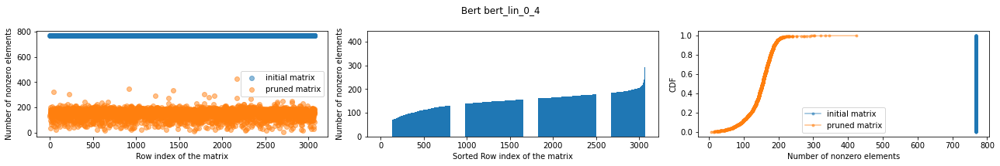

...

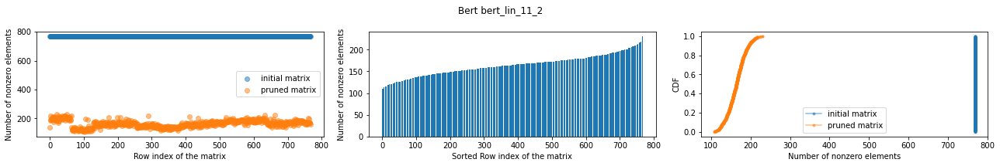

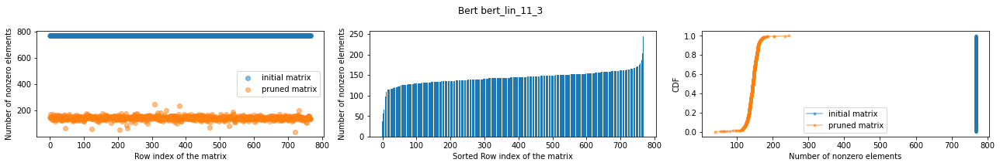

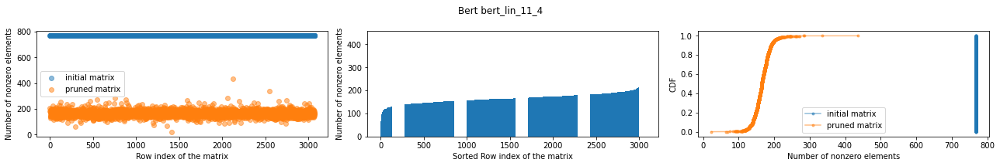

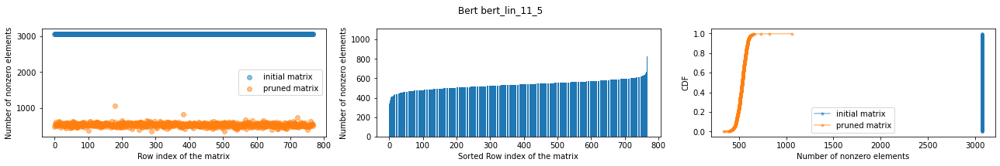

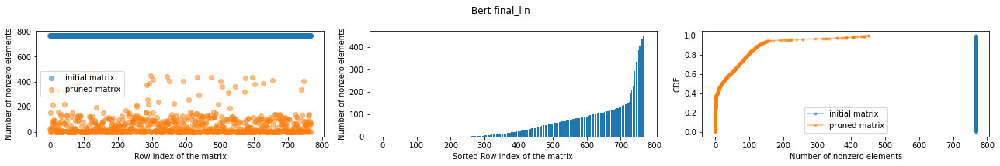

In [18]:
for i in range(12):
    PlotVectorSizes(locals()["bert_lin_"+str(i)+"_0"], locals()["compressed_bert_lin_"+str(i)+"_0"], "Bert bert_lin_"+str(i)+"_0", plot_two_matrces=True)
    PlotVectorSizes(locals()["bert_lin_"+str(i)+"_1"], locals()["compressed_bert_lin_"+str(i)+"_1"], "Bert bert_lin_"+str(i)+"_1", plot_two_matrces=True)
    PlotVectorSizes(locals()["bert_lin_"+str(i)+"_2"], locals()["compressed_bert_lin_"+str(i)+"_2"], "Bert bert_lin_"+str(i)+"_2", plot_two_matrces=True)
    PlotVectorSizes(locals()["bert_lin_"+str(i)+"_3"], locals()["compressed_bert_lin_"+str(i)+"_3"], "Bert bert_lin_"+str(i)+"_3", plot_two_matrces=True)
    PlotVectorSizes(locals()["bert_lin_"+str(i)+"_4"], locals()["compressed_bert_lin_"+str(i)+"_4"], "Bert bert_lin_"+str(i)+"_4", plot_two_matrces=True)
    PlotVectorSizes(locals()["bert_lin_"+str(i)+"_5"], locals()["compressed_bert_lin_"+str(i)+"_5"], "Bert bert_lin_"+str(i)+"_5", plot_two_matrces=True)
    
PlotVectorSizes(final_lin, compressed_final_lin, "Bert final_lin", plot_two_matrces=True)

In [20]:
for i in range(12):
    pickle.dump(locals()["bert_lin_"+str(i)+"_0"], open("../../data/saved_models/bert/bert_lin_"+str(i)+"_0.p", "wb" ))
    pickle.dump(locals()["compressed_bert_lin_"+str(i)+"_0"], open("../../data/saved_models/bert/compressed_80_bert_lin_"+str(i)+"_0.p", "wb" ))
    pickle.dump(locals()["bert_lin_"+str(i)+"_1"], open("../../data/saved_models/bert/bert_lin_"+str(i)+"_1.p", "wb" ))
    pickle.dump(locals()["compressed_bert_lin_"+str(i)+"_1"], open("../../data/saved_models/bert/compressed_80_bert_lin_"+str(i)+"_1.p", "wb" ))
    pickle.dump(locals()["bert_lin_"+str(i)+"_2"], open("../../data/saved_models/bert/bert_lin_"+str(i)+"_2.p", "wb" ))
    pickle.dump(locals()["compressed_bert_lin_"+str(i)+"_2"], open("../../data/saved_models/bert/compressed_80_bert_lin_"+str(i)+"_2.p", "wb" ))
    pickle.dump(locals()["bert_lin_"+str(i)+"_3"], open("../../data/saved_models/bert/bert_lin_"+str(i)+"_3.p", "wb" ))
    pickle.dump(locals()["compressed_bert_lin_"+str(i)+"_3"], open("../../data/saved_models/bert/compressed_80_bert_lin_"+str(i)+"_3.p", "wb" ))
    pickle.dump(locals()["bert_lin_"+str(i)+"_4"], open("../../data/saved_models/bert/bert_lin_"+str(i)+"_4.p", "wb" ))
    pickle.dump(locals()["compressed_bert_lin_"+str(i)+"_4"], open("../../data/saved_models/bert/compressed_80_bert_lin_"+str(i)+"_4.p", "wb" ))
    pickle.dump(locals()["bert_lin_"+str(i)+"_5"], open("../../data/saved_models/bert/bert_lin_"+str(i)+"_5.p", "wb" ))
    pickle.dump(locals()["compressed_bert_lin_"+str(i)+"_5"], open("../../data/saved_models/bert/compressed_80_bert_lin_"+str(i)+"_5.p", "wb" ))

pickle.dump(final_lin, open("../../data/saved_models/bert/final_lin.p", "wb" ))
pickle.dump(compressed_final_lin, open("../../data/saved_models/bert/compressed_80_final_lin.p", "wb" ))

print("model saved in pickle files")

model saved in pickle files
